# 1. Imports

In [6]:
# %% Cell 1: Imports (No changes needed usually)
import os
import random
import glob
import datetime
import time
from PIL import Image
import numpy as np
import math
import subprocess # For running the script
import shlex     # For safely splitting command string

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter
# Keep GradScaler needed for VAE or if bf16 not supported
from torch.cuda.amp import autocast, GradScaler

import torchvision.transforms as transforms
from torchvision.utils import make_grid, save_image

import matplotlib.pyplot as plt
try:
    from tqdm.notebook import tqdm as notebook_tqdm
    from IPython.display import display, clear_output
    IS_NOTEBOOK = True
    print("Notebook environment detected.")
except ImportError:
    from tqdm.auto import tqdm as notebook_tqdm
    IS_NOTEBOOK = False
    print("Notebook environment not fully detected. Using standard tqdm.")
    def clear_output(wait=False): pass

from diffusers import AutoencoderTiny, UNet2DConditionModel, DDPMScheduler

%matplotlib inline

Notebook environment detected.


# 2: Configuration Class

In [12]:
# %% Cell 2: Configuration Class (MODIFIED for DDP and bf16)
class TrainingConfig:
    # --- Hardware & Precision ---
    # List of GPU IDs to use for DDP training script
    GPU_IDS = [0, 1, 2] # <-- CHANGE THIS to the IDs of your GPUs
    # Automatically determine primary device and count based on GPU_IDS
    PRIMARY_GPU_ID = GPU_IDS[0] if GPU_IDS else 0
    NUM_GPUS = len(GPU_IDS) if torch.cuda.is_available() and GPU_IDS else 0
    PRIMARY_DEVICE_NAME = f"cuda:{PRIMARY_GPU_ID}" if NUM_GPUS > 0 else "cpu"
    # bf16 / fp16 settings (Script will check hardware support)
    MIXED_PRECISION_TYPE = "bf16" # "bf16", "fp16", or "no" for fp32
    # Port for DDP communication
    DDP_MASTER_PORT = 29501 # Choose an unused port

    # --- Data ---
    ROOT_DIR = "/cwStorage/nodecw_group/jijh/hest_output"
    TARGET_SIZE = (512, 512)
    IMAGE_EXTS = ['.png', '.jpg', '.jpeg']
    VAE_MAX_SAMPLES = 10000
    PRECOMPUTE_MAX_SAMPLES = None # Use all images
    DIFFUSION_MAX_SAMPLES = None  # Use all latents (should match precompute)

    # --- VAE ---
    VAE_BATCH_SIZE = 64 # For fine-tuning / pre-computation
    VAE_NUM_EPOCHS = 5
    VAE_LEARNING_RATE = 5e-5
    VAE_LATENT_CHANNELS = 4
    VAE_USE_PRETRAINED = True
    VAE_SD_VERSION = 'v2.1'
    VAE_SAVE_IMAGES = False
    VAE_OUTPUT_DIR = 'vae_logs_notebook'
    VAE_MODEL_PATH = "/cwStorage/nodecw_group/jijh/model_path/finetuned_taesd_v21_notebook_apr2.pt"

    # --- Latent Pre-computation ---
    LATENT_DIR = "/cwStorage/nodecw_group/jijh/hest_output_latents_bf16" # <-- Adjusted name
    PRECOMPUTE_BATCH_SIZE = 128
    # Save latents in bf16 if supported, else fp16 (script will handle this logic if needed)
    # Let's aim to save in bf16 if the training will use it primarily.
    # The precompute function will need the hardware check.
    LATENT_SAVE_PRECISION = torch.bfloat16 # Target, will check support

    # --- Diffusion (UNet) --- Training Script Config ---
    # NOTE: This is BATCH SIZE PER GPU for the DDP script
    DIFFUSION_BATCH_SIZE_PER_GPU = 32 # Adjust based on SINGLE GPU memory
    DIFFUSION_NUM_EPOCHS = 15
    DIFFUSION_LEARNING_RATE = 1e-4
    ACCUMULATION_STEPS = 4    # Grad Accumulation per GPU
    # Effective total batch size = BATCH_SIZE_PER_GPU * NUM_GPUS * ACCUMULATION_STEPS
    UNET_SAMPLE_SIZE = 64
    UNET_IN_CHANNELS = 4
    UNET_OUT_CHANNELS = 4
    UNET_BLOCK_OUT_CHANNELS = (320, 640, 1280, 1280)
    UNET_DOWN_BLOCK_TYPES = ('CrossAttnDownBlock2D', 'CrossAttnDownBlock2D', 'CrossAttnDownBlock2D', 'DownBlock2D')
    UNET_UP_BLOCK_TYPES = ('UpBlock2D', 'CrossAttnUpBlock2D', 'CrossAttnUpBlock2D', 'CrossAttnUpBlock2D')
    UNET_CROSS_ATTENTION_DIM = 768
    SCHEDULER_TRAIN_TIMESTEPS = 1000
    SAMPLING_INFERENCE_STEPS = 50
    # Sampling is done by rank 0 in the script
    SAMPLING_BATCH_SIZE = 32 # How many images rank 0 generates during training
    SAMPLING_FINAL_BATCH_SIZE = 64 # How many images rank 0 generates for final sampling

    # --- Training & Logging --- Script Config ---
    NUM_WORKERS = 32 # Number of workers for DataLoader
    CHECKPOINT_DIR = "/cwStorage/nodecw_group/jijh/model_path/"
    LOG_DIR = "/cwStorage/nodecw_group/jijh/training_log/logs_notebook_ddp_bf16"
    CHECKPOINT_FILENAME_PREFIX = "unet_ddp_bf16" # Script will construct full name
    TRAIN_SCRIPT_PATH = "/home1/jijh/diffusion_project/ADiffusion/src/pipeline/train_diffusion_ddp.py" # Path to the training script

    @classmethod
    def get_script_args(cls):
        """Generates CLI arguments for the training script."""
        args = [
            f"--latent_dir={cls.LATENT_DIR}",
            f"--checkpoint_dir={cls.CHECKPOINT_DIR}",
            f"--log_dir={cls.LOG_DIR}",
            f"--vae_model_path={cls.VAE_MODEL_PATH}", # Pass VAE path for sampling
            f"--vae_sd_version={cls.VAE_SD_VERSION}", # Pass VAE version for sampling
            f"--epochs={cls.DIFFUSION_NUM_EPOCHS}",
            f"--batch_size_per_gpu={cls.DIFFUSION_BATCH_SIZE_PER_GPU}",
            f"--lr={cls.DIFFUSION_LEARNING_RATE}",
            f"--accumulation_steps={cls.ACCUMULATION_STEPS}",
            f"--mixed_precision={cls.MIXED_PRECISION_TYPE}",
            f"--unet_sample_size={cls.UNET_SAMPLE_SIZE}",
            f"--unet_in_channels={cls.UNET_IN_CHANNELS}",
            f"--unet_out_channels={cls.UNET_OUT_CHANNELS}",
            # Pass tuple arguments carefully, e.g., as comma-separated strings
            f"--unet_block_out_channels={','.join(map(str, cls.UNET_BLOCK_OUT_CHANNELS))}",
            f"--unet_down_block_types={','.join(cls.UNET_DOWN_BLOCK_TYPES)}",
            f"--unet_up_block_types={','.join(cls.UNET_UP_BLOCK_TYPES)}",
            f"--unet_cross_attention_dim={cls.UNET_CROSS_ATTENTION_DIM}",
            f"--scheduler_train_timesteps={cls.SCHEDULER_TRAIN_TIMESTEPS}",
            f"--sampling_inference_steps={cls.SAMPLING_INFERENCE_STEPS}",
            f"--sampling_batch_size={cls.SAMPLING_BATCH_SIZE}",
            f"--num_workers={cls.NUM_WORKERS}",
            f"--checkpoint_filename_prefix={cls.CHECKPOINT_FILENAME_PREFIX}",
            f"--log_interval=10", # Example: Log basic loss every 10 steps
            f"--sample_interval=1", # Example: Sample every 1 epoch
            f"--save_interval=1", # Example: Save checkpoint every 1 epoch
        ]
        # Add max_samples if set
        if cls.DIFFUSION_MAX_SAMPLES is not None:
             args.append(f"--max_samples={cls.DIFFUSION_MAX_SAMPLES}")

        return args

# 3: Dataset Definition

In [ ]:
# %% Cell 3: Dataset Definition (Original Image Dataset - Used for VAE & Pre-computation)
# (Keep the TilesDataset class from the original code exactly as it was)
from tqdm import tqdm
class TilesDataset(Dataset):
    """
    Loads images from subdirectories, resizes, and normalizes to [-1, 1].
    """
    def __init__(self, root_dir, target_size=(512, 512), image_exts=['.png', '.jpg', '.jpeg'], max_samples=None):
        self.root_dir = root_dir
        self.target_size = target_size
        self.image_paths = []
        if not os.path.isdir(root_dir):
             raise FileNotFoundError(f"Root directory not found: {root_dir}")

        subfolders = [os.path.join(root_dir, d) for d in os.listdir(root_dir)
                      if os.path.isdir(os.path.join(root_dir, d))]
        if not subfolders:
            print(f"Warning: No subfolders found in {root_dir}. Searching directly in root_dir.")
            subfolders = [root_dir] # Search directly in root if no subfolders

        print(f"Searching for images in: {subfolders}")
        all_paths = []
        for folder in tqdm(subfolders, desc="Scanning image folders"):
            for ext in image_exts:
                all_paths.extend(glob.glob(os.path.join(folder, f'*{ext}')))

        if not all_paths:
             raise FileNotFoundError(f"No images found with extensions {image_exts} in {root_dir} and its subdirectories.")

        # Filter out potential non-image files that might have image extensions
        print(f"Verifying {len(all_paths)} potential image paths...")
        verified_paths = all_paths
        self.image_paths = verified_paths
        print(f"Found {len(self.image_paths)} valid images.")


        if max_samples is not None and len(self.image_paths) > max_samples:
            print(f"Sampling {max_samples} images from {len(self.image_paths)} found.")
            self.image_paths = random.sample(self.image_paths, max_samples)
        print(f"Initialized TilesDataset with {len(self.image_paths)} images.")

        self.transform = transforms.Compose([
            transforms.Resize(target_size, interpolation=transforms.InterpolationMode.LANCZOS),
            transforms.ToTensor(),  # [0,1]
            transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]) # to [-1,1]
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        try:
            # Ensure reopening after verify()
            image = Image.open(img_path).convert("RGB")
            image = self.transform(image)
            return image, img_path # Return image path for saving latents
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")
            # Return None to be filtered by collate_fn
            return None, None

# 4: VAE Utility Functions

In [ ]:
# %% Cell 4: VAE Utility Functions
# (Keep get_vae_model, compute_vae_loss, log_vae_images, train_vae as they were)
# get_vae_model, compute_vae_loss, log_vae_images, train_vae functions remain the same
# ... (include the original code for these functions here) ...
def get_vae_model(config: TrainingConfig):
    """Gets the VAE model (pretrained TinyVAE or new)."""
    if config.VAE_USE_PRETRAINED:
        model_name = "madebyollin/taesd" if config.VAE_SD_VERSION == 'v2.1' else "madebyollin/taesdxl"
        try:
            # Ensure transformers is updated if facing import errors with AutoencoderTiny
            vae = AutoencoderTiny.from_pretrained(model_name, torch_dtype=torch.float32)
            print(f"Loaded pretrained Tiny AutoEncoder: {model_name}")
        except Exception as e:
             print(f"Error loading pretrained VAE {model_name}: {e}. Creating new one.")
             vae = AutoencoderTiny(latent_channels=config.VAE_LATENT_CHANNELS) # Basic config
             print("Created new Tiny AutoEncoder model from scratch.")
    else:
        vae = AutoencoderTiny(
            in_channels=3, out_channels=3, latent_channels=config.VAE_LATENT_CHANNELS,
            # Add other relevant params from TAESD defaults if needed
        )
        print("Created new Tiny AutoEncoder model from scratch.")
    # Add scaling_factor to config if it doesn't exist for consistency, TAESD defaults to 1.0
    if not hasattr(vae.config, 'scaling_factor'):
        vae.config.scaling_factor = 1.0
    return vae

# --- MODIFIED Loss Function ---
def compute_vae_loss(vae, images):
    """
    Computes VAE reconstruction loss (MSE) for AutoencoderTiny.
    KL divergence is not calculated as TinyVAE doesn't expose mu/logvar.
    """
    amp_enabled = images.device.type == 'cuda'
    with autocast(enabled=amp_enabled):
        # AutoencoderTiny's encode returns AutoencoderTinyOutput(latents=...)
        encoded_output = vae.encode(images)
        latents = encoded_output.latents # Directly access latents

        # TinyVAE typically doesn't use the same scaling factor concept as KL-VAE during encode/decode
        # Check its forward pass or specific usage if needed, but usually, decode takes raw latents.
        # Let's assume direct decoding here based on TAESD usage patterns.
        decoded_output = vae.decode(latents) # Pass latents directly
        recon_images = decoded_output.sample

        # Calculate only reconstruction loss
        recon_loss = F.mse_loss(recon_images, images, reduction='mean')
        total_loss = recon_loss
        # Set kl_loss to zero or None for consistent return signature if needed elsewhere
        kl_loss = torch.tensor(0.0, device=images.device)

    return total_loss, recon_loss, kl_loss # Return 0 for KL loss

# --- MODIFIED Image Logging ---
def log_vae_images(vae, dataloader, device, epoch, config: TrainingConfig):
    """Logs original vs reconstructed images. Clears output in notebook."""
    vae.eval()
    try:
        # Ensure dataloader provides a batch
        batch_data = next(iter(dataloader))
        # Handle dataset returning (image, path) or just image
        if isinstance(batch_data, (list, tuple)):
            images = batch_data[0]
        else:
            images = batch_data

        if images is None or len(images) == 0:
             print("DataLoader returned empty batch, cannot generate VAE log image.")
             vae.train()
             return
    except StopIteration:
        print("DataLoader exhausted, cannot generate VAE log image.")
        vae.train()
        return

    images = images.to(device)
    amp_enabled = images.device.type == 'cuda'

    with torch.no_grad(), autocast(enabled=amp_enabled):
        encoded_output = vae.encode(images)
        latents = encoded_output.latents # Get latents directly
        decoded_output = vae.decode(latents) # Decode latents directly
        recon_images = decoded_output.sample

    num_show = min(8, images.size(0))
    comparison = torch.cat([images[:num_show], recon_images[:num_show]], dim=0)
    grid = make_grid(comparison, nrow=num_show, normalize=True, value_range=(-1, 1))

    if IS_NOTEBOOK:
        clear_output(wait=True)

    plt.figure(figsize=(12, 3 * (comparison.size(0) // num_show) if num_show > 0 else 3 ))
    plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
    plt.title(f"VAE Epoch {epoch}: Original (top) vs Reconstructed (bottom)")
    plt.axis('off')
    plt.show()

    if config.VAE_SAVE_IMAGES:
        os.makedirs(config.VAE_OUTPUT_DIR, exist_ok=True)
        save_path = os.path.join(config.VAE_OUTPUT_DIR, f'vae_orig_recon_epoch_{epoch}.png')
        save_image(comparison, save_path, nrow=num_show, normalize=True, value_range=(-1, 1))
        print(f"Saved VAE comparison image to {save_path}")
    vae.train()

# --- MODIFIED Training Loop ---
def train_vae(vae, dataloader, optimizer, device, config: TrainingConfig):
    """Trains the VAE model (TinyVAE focused). Uses notebook tqdm and output clearing."""
    vae.train()
    amp_enabled = device.type == 'cuda'
    scaler = GradScaler(enabled=amp_enabled)

    print("Starting VAE Fine-tuning (TinyVAE - Reconstruction Loss Only)...")
    for epoch in range(1, config.VAE_NUM_EPOCHS + 1):
        epoch_loss, epoch_recon = 0.0, 0.0 # Removed epoch_kl tracking
        progress_bar = notebook_tqdm(dataloader, desc=f"VAE Epoch {epoch}/{config.VAE_NUM_EPOCHS}", leave=False)

        for batch_idx, batch_data in enumerate(progress_bar):
            # Handle dataset returning (image, path) or just image
            if isinstance(batch_data, (list, tuple)):
                images = batch_data[0]
            else:
                images = batch_data

            if images is None: continue # Skip if dataloader had an error
            images = images.to(device)
            optimizer.zero_grad()

            loss, recon_loss, _ = compute_vae_loss(vae, images) # Ignore KL loss return

            if amp_enabled:
                 scaler.scale(loss).backward()
                 scaler.step(optimizer)
                 scaler.update()
            else:
                 loss.backward()
                 optimizer.step()

            epoch_loss += loss.item()
            epoch_recon += recon_loss.item()

            progress_bar.set_postfix({
                "Loss": f"{loss.item():.4f}",
                "Recon": f"{recon_loss.item():.4f}", # Removed KL display
            })

        avg_loss = epoch_loss / len(dataloader)
        avg_recon = epoch_recon / len(dataloader)
        # Removed avg_kl calculation and printing
        print(f"VAE Epoch {epoch} completed: Avg Loss: {avg_loss:.4f}, Recon: {avg_recon:.4f}")

        # Log images at the end of each epoch
        log_vae_images(vae, dataloader, device, epoch, config)

    print("VAE Fine-tuning finished!")
    os.makedirs(os.path.dirname(config.VAE_MODEL_PATH), exist_ok=True)
    torch.save(vae.state_dict(), config.VAE_MODEL_PATH)
    print(f"Fine-tuned VAE saved to {config.VAE_MODEL_PATH}")
    return vae


# 5: Latent Pre-computation Function (NEW)

In [15]:
# %% Cell 5: VAE Setup and Optional Fine-tuning
config = TrainingConfig() # Load config

# --- Device Setup for VAE/Precompute (Uses Primary GPU) ---
if config.NUM_GPUS > 0:
    vae_device = torch.device(config.PRIMARY_DEVICE_NAME)
    torch.cuda.set_device(vae_device)
    print(f"Using Primary GPU for VAE/Precompute: {torch.cuda.get_device_name(vae_device)}")
    # Check bf16 support on this device
    if torch.cuda.is_available() and torch.cuda.is_bf16_supported():
        print("bf16 format is supported on this GPU.")
        TARGET_VAE_AMP_DTYPE = torch.bfloat16
        # Adjust latent save precision based on support
        config.LATENT_SAVE_PRECISION = torch.bfloat16
        print(f"Setting LATENT_SAVE_PRECISION to {config.LATENT_SAVE_PRECISION}")
    else:
        print("bf16 format is NOT supported. Will use float16 for AMP if enabled.")
        TARGET_VAE_AMP_DTYPE = torch.float16
        # Fallback latent save precision
        config.LATENT_SAVE_PRECISION = torch.float16
        print(f"Setting LATENT_SAVE_PRECISION to {config.LATENT_SAVE_PRECISION}")

else:
    vae_device = torch.device("cpu")
    print("Using CPU for VAE/Precompute.")
    TARGET_VAE_AMP_DTYPE = torch.float32 # No AMP on CPU
    config.LATENT_SAVE_PRECISION = torch.float32 # Save as float32 if no GPU
    print(f"Setting LATENT_SAVE_PRECISION to {config.LATENT_SAVE_PRECISION}")

# --- VAE Model Loading ---
print("--- VAE Setup ---")
vae = get_vae_model(config)
if config.VAE_USE_PRETRAINED and os.path.exists(config.VAE_MODEL_PATH):
    print(f"Attempting to load fine-tuned VAE from {config.VAE_MODEL_PATH}")
    try:
        vae.load_state_dict(torch.load(config.VAE_MODEL_PATH, map_location='cpu'))
        print("Successfully loaded fine-tuned VAE.")
    except Exception as e:
        print(f"Could not load fine-tuned VAE state dict: {e}. Using default pretrained.")
elif config.VAE_USE_PRETRAINED:
    print(f"VAE model path {config.VAE_MODEL_PATH} not found. Using default pretrained.")
else:
    print("Using newly initialized VAE.")

Using Primary GPU for VAE/Precompute: NVIDIA H100 PCIe
bf16 format is supported on this GPU.
Setting LATENT_SAVE_PRECISION to torch.bfloat16
--- VAE Setup ---
Loaded pretrained Tiny AutoEncoder: madebyollin/taesd
VAE model path /cwStorage/nodecw_group/jijh/model_path/finetuned_taesd_v21_notebook_apr2.pt not found. Using default pretrained.


In [16]:
vae.to(vae_device)
vae.eval()

AutoencoderTiny(
  (encoder): EncoderTiny(
    (layers): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): AutoencoderTinyBlock(
        (conv): Sequential(
          (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): ReLU()
          (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (3): ReLU()
          (4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
        (skip): Identity()
        (fuse): ReLU()
      )
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (3): AutoencoderTinyBlock(
        (conv): Sequential(
          (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): ReLU()
          (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (3): ReLU()
          (4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  

In [22]:
# Loat 16 images to test the reconstruction with first row as original and second row as reconstructed
test_dataset = TilesDataset(config.ROOT_DIR, target_size=config.TARGET_SIZE, image_exts=config.IMAGE_EXTS)


Searching for images in: ['/cwStorage/nodecw_group/jijh/hest_output/TENX105_tiles', '/cwStorage/nodecw_group/jijh/hest_output/NCBI861_tiles', '/cwStorage/nodecw_group/jijh/hest_output/NCBI146_tiles', '/cwStorage/nodecw_group/jijh/hest_output/NCBI192_expr', '/cwStorage/nodecw_group/jijh/hest_output/NCBI563_tiles', '/cwStorage/nodecw_group/jijh/hest_output/SPA45_tiles', '/cwStorage/nodecw_group/jijh/hest_output/NCBI462_expr', '/cwStorage/nodecw_group/jijh/hest_output/MISC107_tiles', '/cwStorage/nodecw_group/jijh/hest_output/MISC58_tiles', '/cwStorage/nodecw_group/jijh/hest_output/NCBI434_tiles', '/cwStorage/nodecw_group/jijh/hest_output/TENX24_expr', '/cwStorage/nodecw_group/jijh/hest_output/MEND35_expr', '/cwStorage/nodecw_group/jijh/hest_output/NCBI296_expr', '/cwStorage/nodecw_group/jijh/hest_output/NCBI492_expr', '/cwStorage/nodecw_group/jijh/hest_output/SPA3_expr', '/cwStorage/nodecw_group/jijh/hest_output/TENX136_expr', '/cwStorage/nodecw_group/jijh/hest_output/NCBI44_tiles', '/cwS

Scanning image folders: 100%|██████████| 2458/2458 [00:13<00:00, 184.50it/s]

Verifying 2104169 potential image paths...
Found 2104169 valid images.
Initialized TilesDataset with 2104169 images.


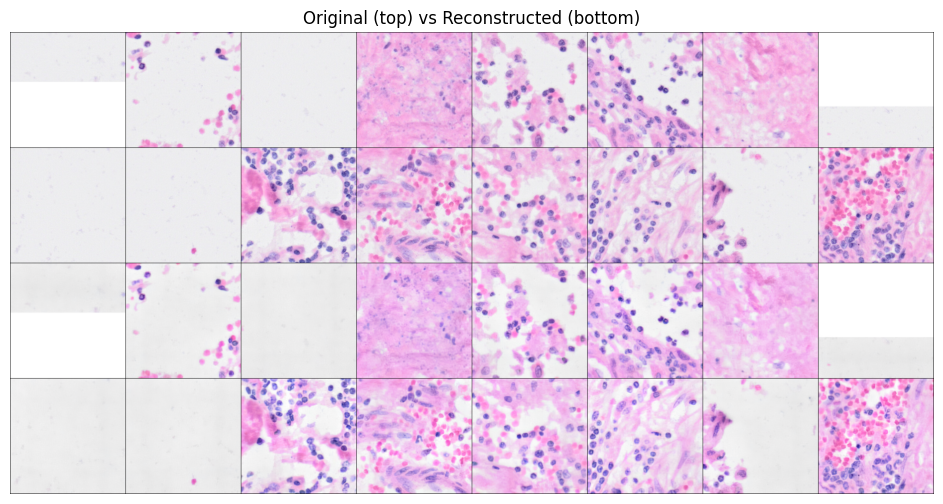

In [23]:
test_dataloader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=config.NUM_WORKERS)
test_images, _ = next(iter(test_dataloader))
test_images = test_images.to(vae_device)
with torch.no_grad():
    encoded_output = vae.encode(test_images)
    latents = encoded_output.latents
    decoded_output = vae.decode(latents)
    recon_images = decoded_output.sample
comparison = torch.cat([test_images, recon_images], dim=0)
grid = make_grid(comparison, nrow=8, normalize=True, value_range=(-1, 1))
plt.figure(figsize=(12, 6))
plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
plt.title("Original (top) vs Reconstructed (bottom)")
plt.axis('off')
plt.show()

# 6: Latent Pre-computation Function (MODIFIED for bf16 support)

In [35]:
# %% Cell 6: Latent Pre-computation Function (MODIFIED for bf16 support AND original structure)
def precompute_and_save_latents(vae, config: TrainingConfig, device):
    """
    Encodes images using VAE and saves latents to disk mirroring the
    original directory structure under config.LATENT_DIR.
    Latents are saved using config.LATENT_SAVE_PRECISION.
    """
    vae.eval()
    vae.to(device)

    # Determine the torch dtype for saving based on config and support
    save_dtype = config.LATENT_SAVE_PRECISION
    if save_dtype == torch.bfloat16 and not (device.type == 'cuda' and torch.cuda.is_bf16_supported()):
        print(f"Warning: Config requests LATENT_SAVE_PRECISION=bf16, but not supported on {device}. Falling back to float16.")
        save_dtype = torch.float16
    elif save_dtype not in [torch.float16, torch.bfloat16, torch.float32]: # Allow float32 for CPU case
         print(f"Warning: Unsupported LATENT_SAVE_PRECISION {save_dtype}. Falling back to float16.")
         save_dtype = torch.float16

    print(f"--- Starting Latent Pre-computation (Saving as {save_dtype}, mirroring structure) ---")
    precompute_dataset = TilesDataset(
        root_dir=config.ROOT_DIR,
        target_size=config.TARGET_SIZE,
        max_samples=config.PRECOMPUTE_MAX_SAMPLES
    )

    def precompute_collate_fn(batch):
        filtered_batch = [item for item in batch if item[0] is not None and item[1] is not None]
        if not filtered_batch: return None, None
        images = torch.stack([item[0] for item in filtered_batch])
        paths = [item[1] for item in filtered_batch]
        return images, paths

    precompute_dataloader = DataLoader(
        precompute_dataset, batch_size=config.PRECOMPUTE_BATCH_SIZE, shuffle=False,
        num_workers=config.NUM_WORKERS, pin_memory=True, collate_fn=precompute_collate_fn
    )

    latent_dir = config.LATENT_DIR
    os.makedirs(latent_dir, exist_ok=True) # Ensure base latent directory exists
    print(f"Saving latents mirroring structure under: {latent_dir}")

    # # --- Skip Check (More complex with mirrored structure) ---
    # # A simple count isn't reliable here. We could check if a specific expected file exists,
    # # or compare timestamps, but a full skip is harder. Let's make the prompt less definitive.
    # user_input = input(f"Pre-computation will save latents to {latent_dir}, potentially overwriting existing files. Continue? (y/n): ").lower()
    # if user_input != 'y':
    #     print("Skipping latent pre-computation by user request.")
    #     return
    # # --- End Skip Check ---

    count = 0
    amp_enabled = device.type == 'cuda'
    amp_dtype = torch.bfloat16 if save_dtype == torch.bfloat16 else torch.float16
    if not amp_enabled: amp_dtype = torch.float32 # Handle CPU case

    start_time = time.time()
    progress_bar = notebook_tqdm(precompute_dataloader, desc="Pre-computing Latents")

    with torch.no_grad():
        for images, img_paths in progress_bar:
            if images is None: continue
            images = images.to(device)

            with autocast(enabled=amp_enabled, dtype=amp_dtype):
                encoded_output = vae.encode(images)
                latents = encoded_output.latents
                

            latents_cpu = latents.detach().to('cpu', dtype=save_dtype)

            for i, img_path in enumerate(img_paths):
                try:
                    # --- NEW LOGIC for path generation ---
                    # 1. Get the relative path of the image from the root data dir
                    # e.g., "subdir1/subdir2/image_abc.png"
                    relative_img_path = os.path.relpath(img_path, config.ROOT_DIR)

                    # 2. Split the relative path into directory and filename
                    # e.g., ("subdir1/subdir2", "image_abc.png")
                    relative_dir, img_filename = os.path.split(relative_img_path)

                    # 3. Get the image filename without its extension
                    # e.g., "image_abc"
                    img_basename = os.path.splitext(img_filename)[0]

                    # 4. Construct the target directory within the latent root dir
                    # e.g., "/path/to/LATENT_DIR/subdir1/subdir2"
                    target_latent_dir = os.path.join(config.LATENT_DIR, relative_dir)

                    # 5. Construct the final latent filename
                    # e.g., "image_abc.pt"
                    latent_filename = img_basename + ".pt"

                    # 6. Construct the full save path
                    # e.g., "/path/to/LATENT_DIR/subdir1/subdir2/image_abc.pt"
                    latent_save_path = os.path.join(target_latent_dir, latent_filename)

                    # 7. Ensure the target subdirectory exists
                    os.makedirs(target_latent_dir, exist_ok=True)
                    # --- End NEW LOGIC ---
                    tensor_to_save = latents_cpu[i].clone() # Clone to avoid in-place operation
                    # DEBUG block...
                    if count < 5:
                        print(f"\n--- Saving Debug Info ---")
                        print(f"Image Path: {img_path}")
                        print(f"Save Path: {latent_save_path}")
                        print(f"Tensor Shape: {tensor_to_save.shape}")  # <-- ***CHECK THIS OUTPUT***
                        print(f"Tensor Dtype: {tensor_to_save.dtype}")
                        print(f"Tensor Elements: {tensor_to_save.nelement()}")
                        print(f"Expected Size (bytes, approx): {tensor_to_save.nelement() * tensor_to_save.element_size()}")
                        print(f"-------------------------")

                    # 8. Save the latent tensor
                    torch.save(tensor_to_save, latent_save_path) # Save the debugged tensor
                    count += 1

                except Exception as e:
                    # Print error but continue processing other images in the batch
                    print(f"\nError processing/saving latent for image {img_path}: {e}")
                    # Optionally log this error more formally

            progress_bar.set_postfix({"Saved": count})

    total_time = time.time() - start_time
    print(f"--- Latent Pre-computation Finished ---")
    print(f"Saved {count} latents as {save_dtype}, mirroring structure under {latent_dir}")
    print(f"Total time: {str(datetime.timedelta(seconds=int(total_time)))}")

# 7: Execute Latent Pre-computation

In [36]:
# (Make sure VAE is loaded and on vae_device before running this)
precompute_and_save_latents(vae, config, vae_device)
# Optional: Remove VAE from memory if not needed further in the notebook
# del vae
# if 'vae_device' in locals() and vae_device.type == 'cuda':
#    torch.cuda.empty_cache()
# print("VAE potentially removed from memory.")

--- Starting Latent Pre-computation (Saving as torch.bfloat16, mirroring structure) ---
Searching for images in: ['/cwStorage/nodecw_group/jijh/hest_output/TENX105_tiles', '/cwStorage/nodecw_group/jijh/hest_output/NCBI861_tiles', '/cwStorage/nodecw_group/jijh/hest_output/NCBI146_tiles', '/cwStorage/nodecw_group/jijh/hest_output/NCBI192_expr', '/cwStorage/nodecw_group/jijh/hest_output/NCBI563_tiles', '/cwStorage/nodecw_group/jijh/hest_output/SPA45_tiles', '/cwStorage/nodecw_group/jijh/hest_output/NCBI462_expr', '/cwStorage/nodecw_group/jijh/hest_output/MISC107_tiles', '/cwStorage/nodecw_group/jijh/hest_output/MISC58_tiles', '/cwStorage/nodecw_group/jijh/hest_output/NCBI434_tiles', '/cwStorage/nodecw_group/jijh/hest_output/TENX24_expr', '/cwStorage/nodecw_group/jijh/hest_output/MEND35_expr', '/cwStorage/nodecw_group/jijh/hest_output/NCBI296_expr', '/cwStorage/nodecw_group/jijh/hest_output/NCBI492_expr', '/cwStorage/nodecw_group/jijh/hest_output/SPA3_expr', '/cwStorage/nodecw_group/jijh/h

Scanning image folders: 100%|██████████| 2458/2458 [00:12<00:00, 202.56it/s]

Verifying 2104169 potential image paths...
Found 2104169 valid images.
Initialized TilesDataset with 2104169 images.
Saving latents mirroring structure under: /cwStorage/nodecw_group/jijh/hest_output_latents_bf16


Pre-computing Latents:   0%|          | 0/16439 [00:00<?, ?it/s]

/tmp/ipykernel_55472/321954933.py:65: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=amp_enabled, dtype=amp_dtype):



--- Saving Debug Info ---
Image Path: /cwStorage/nodecw_group/jijh/hest_output/TENX105_tiles/TENX105_27348_5388.png
Save Path: /cwStorage/nodecw_group/jijh/hest_output_latents_bf16/TENX105_tiles/TENX105_27348_5388.pt
Tensor Shape: torch.Size([4, 64, 64])
Tensor Dtype: torch.bfloat16
Tensor Elements: 16384
Expected Size (bytes, approx): 32768
-------------------------

--- Saving Debug Info ---
Image Path: /cwStorage/nodecw_group/jijh/hest_output/TENX105_tiles/TENX105_12734_7215.png
Save Path: /cwStorage/nodecw_group/jijh/hest_output_latents_bf16/TENX105_tiles/TENX105_12734_7215.pt
Tensor Shape: torch.Size([4, 64, 64])
Tensor Dtype: torch.bfloat16
Tensor Elements: 16384
Expected Size (bytes, approx): 32768
-------------------------

--- Saving Debug Info ---
Image Path: /cwStorage/nodecw_group/jijh/hest_output/TENX105_tiles/TENX105_17118_273.png
Save Path: /cwStorage/nodecw_group/jijh/hest_output_latents_bf16/TENX105_tiles/TENX105_17118_273.pt
Tensor Shape: torch.Size([4, 64, 64])
Tens

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



: 

: 

# 8: Launch DDP Training Script

In [13]:
# %% Cell 8: Launch DDP Training Script (MODIFIED to use python -m)
import sys # <-- Add this import at the top of the cell or notebook

print("--- Preparing to Launch DDP Training Script ---")
config = TrainingConfig() # Reload config to ensure it's current

if not os.path.exists(config.TRAIN_SCRIPT_PATH):
    print(f"Error: Training script '{config.TRAIN_SCRIPT_PATH}' not found.")
    print("Please ensure the script is in the same directory or provide the correct path.")
else:
    if config.NUM_GPUS == 0:
        print("Error: No GPUs specified in config.GPU_IDS or CUDA not available.")
        print("Cannot launch DDP script.")
    else:
        # --- MODIFIED COMMAND CONSTRUCTION ---
        # Use the current Python executable to run the distributed module
        python_executable = sys.executable
        print(f"Using Python executable: {python_executable}")

        cmd = [
            python_executable,                   # Use the kernel's python
            "-m", "torch.distributed.run",       # Invoke the run module
            f"--nproc_per_node={config.NUM_GPUS}",
            f"--master_port={config.DDP_MASTER_PORT}",
            # f"--use_env", # Often used with torch.distributed.run, might not be needed if rank/world_size are set by the module
            config.TRAIN_SCRIPT_PATH,
        ]
        # --- END MODIFIED COMMAND CONSTRUCTION ---

        # Add arguments generated from config
        cmd.extend(config.get_script_args())

        print("Launching command:")
        # Use shlex.join for safer printing of the command
        print(shlex.join(cmd))
        print("-" * 30)

        # Run the command using subprocess and stream output
        # Make sure the environment variables are passed correctly if needed
        # Often, the current environment is inherited by default
        process = subprocess.Popen(cmd, stdout=subprocess.PIPE, stderr=subprocess.STDOUT, text=True, bufsize=1, encoding='utf-8', errors='replace') # Added encoding/errors

        print("Script Output:")
        while True:
            output = process.stdout.readline()
            if output == '' and process.poll() is not None:
                break
            if output:
                # Simple print, consider more robust logging if needed
                try:
                    print(output.strip())
                except Exception as e_print:
                    # Handle potential encoding issues during print
                    print(f"[Non-decodable output line, Error: {e_print}]")


        rc = process.poll()
        print("-" * 30)
        if rc == 0:
            print("Training script finished successfully.")
        else:
            print(f"Training script exited with error code {rc}.")

--- Preparing to Launch DDP Training Script ---
Using Python executable: /public/home/jijh/micromamba/envs/gpu_env/bin/python
Launching command:
/public/home/jijh/micromamba/envs/gpu_env/bin/python -m torch.distributed.run --nproc_per_node=3 --master_port=29501 /home1/jijh/diffusion_project/ADiffusion/src/pipeline/train_diffusion_ddp.py --latent_dir=/cwStorage/nodecw_group/jijh/hest_output_latents_bf16 --checkpoint_dir=/cwStorage/nodecw_group/jijh/model_path/ --log_dir=/cwStorage/nodecw_group/jijh/training_log/logs_notebook_ddp_bf16 --vae_model_path=/cwStorage/nodecw_group/jijh/model_path/finetuned_taesd_v21_notebook_apr2.pt --vae_sd_version=v2.1 --epochs=15 --batch_size_per_gpu=32 --lr=0.0001 --accumulation_steps=4 --mixed_precision=bf16 --unet_sample_size=64 --unet_in_channels=4 --unet_out_channels=4 --unet_block_out_channels=320,640,1280,1280 --unet_down_block_types=CrossAttnDownBlock2D,CrossAttnDownBlock2D,CrossAttnDownBlock2D,DownBlock2D --unet_up_block_types=UpBlock2D,CrossAttnUp

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Epoch 4/15:  71%|███████   | 15552/21918 [3:42:17<1:13:07,  1.45it/s, loss=0.1528, lr=8.58e-05, step=20328]


IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Epoch 4/15: 100%|██████████| 21918/21918 [5:29:22<00:00,  1.41s/it, loss=0.0641, lr=8.36e-05, step=21920]

Epoch 4 completed. Avg Loss (Rank 0): 0.126418, Avg Loss (All Ranks): 0.126121
Time: 5:29:22, Total: 5:29:22
Generating samples...

Sampling: 100%|██████████| 50/50 [00:56<00:00,  1.11s/it]

Saved sample grid to /cwStorage/nodecw_group/jijh/training_log/logs_notebook_ddp_bf16/samples/epoch_4.png
Checkpoint saved at epoch 4 to /cwStorage/nodecw_group/jijh/model_path/unet_ddp_bf16_ep4_bs32x3_lr0.0001_acc4.pt

Epoch 5/15:   0%|          | 0/21918 [00:00<?, ?it/s]/home1/jijh/diffusion_project/ADiffusion/src/pipeline/train_diffusion_ddp.py:111: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). I

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Epoch 14/15:  39%|███▉      | 8505/21918 [2:21:05<2:43:29,  1.37it/s, loss=0.1469, lr=3.79e-06, step=73366]
